# Demo Part 1: Data Ingestion using `intake`
- author: hjsong
- date: 05/22/2019

Use python's `intake` library to simplify the data ingestion process.
It's an awesome way to maintain data catalogs both for local and remote data sources.
Great to hide data reading details (often the first boilerplate step before data analysis that clogs the code)
- Also supports GUI
- yaml configuration files keep the information on how to load each data source (driver type -- we can write our own as a plugin)
- also specify any metadata 
    - eg: plot types supported for the data source
    - supports easy integration with holoviews
    


In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os, sys
from pathlib import Path
from pprint import pprint

UTILS_DIR = Path('../utils').absolute()
assert UTILS_DIR.exists()
if str(UTILS_DIR) not in sys.path:
    sys.path.insert(0, str(UTILS_DIR))
    print(f"Added {str(UTILS_DIR)} to sys.path")

pprint(sys.path)
    

Added /home/hayley/Playground/Geo/EarthML/examples/tutorial/../utils to sys.path
['/home/hayley/Playground/Geo/EarthML/examples/tutorial/../utils',
 '',
 '/home/hayley/Playground/Geo/EarthML/examples/tutorial',
 '/home/hayley/miniconda3/envs/earthml/lib/python37.zip',
 '/home/hayley/miniconda3/envs/earthml/lib/python3.7',
 '/home/hayley/miniconda3/envs/earthml/lib/python3.7/lib-dynload',
 '/home/hayley/miniconda3/envs/earthml/lib/python3.7/site-packages',
 '/home/hayley/miniconda3/envs/earthml/lib/python3.7/site-packages/IPython/extensions',
 '/home/hayley/.ipython']


In [3]:
# Don't want to see deprecation warnings
# https://docs.python.org/3/library/warnings.html#warning-filter
# jupyternotebooks are run as '__main__' module
# print(__name___) #at the console
      
import warnings
pprint(warnings.filters)

[('once', None, <class 'Warning'>, None, 0),
 ('error',
  None,
  <class 'IPython.core.completer.ProvisionalCompleterWarning'>,
  None,
  0),
 ('default', None, <class 'DeprecationWarning'>, '__main__', 0),
 ('ignore', None, <class 'DeprecationWarning'>, None, 0),
 ('ignore', None, <class 'PendingDeprecationWarning'>, None, 0),
 ('ignore', None, <class 'ImportWarning'>, None, 0),
 ('ignore', None, <class 'ResourceWarning'>, None, 0)]


In [4]:
if not sys.warnoptions:
    warnings.simplefilter('ignore')

In [5]:
# don't write bytecode
sys.dont_write_bytecode = True

In [34]:
from utils import get_mro as mro, nprint, dict2json, display_dict2json, cols_with_null

## Inline loading

We'll start with the simple case of loading small local datasets, such as a .csv file for Pandas:

In [7]:
import intake
print(list(intake.cat))

['airline_flights', 'us_crime', 'states']


In [8]:
cat_crime = intake.cat.us_crime
cat_info = cat_crime.discover()
varnames = list(cat_info['dtype'].keys())
meta = cat_info['metadata']
nprint('cat entry info') 
nprint('varnames',varnames)
nprint('meta', meta)

'cat entry info'
'varnames'
['Year',
 'Population',
 'Violent crime total',
 'Murder and nonnegligent Manslaughter',
 'Legacy rape /1',
 'Revised rape /2',
 'Robbery',
 'Aggravated assault',
 'Property crime total',
 'Burglary',
 'Larceny-theft',
 'Motor vehicle theft',
 'Violent Crime rate',
 'Murder and nonnegligent manslaughter rate',
 'Legacy rape rate /1',
 'Revised rape rate /2',
 'Robbery rate',
 'Aggravated assault rate',
 'Property crime rate',
 'Burglary rate',
 'Larceny-theft rate',
 'Motor vehicle theft rate']
'meta'
{'cache': [],
 'catalog_dir': '/home/hayley/miniconda3/envs/earthml/share/intake/',
 'plots': {'example': {'kind': 'line',
                       'x': 'Year',
                       'y': ['Robbery', 'Burglary']}}}


In [9]:
# meta = cat_info.get('metadata')
plots_info = meta['plots']
pprint(plots_info)

{'example': {'kind': 'line', 'x': 'Year', 'y': ['Robbery', 'Burglary']}}


In [10]:
# plot names
plot_names = cat_crime.plots
for pname in plot_names:
    nprint(pname,plots_info[pname])

'example'
{'kind': 'line', 'x': 'Year', 'y': ['Robbery', 'Burglary']}


In [11]:
# Quick visualization

In [12]:
intake.output_notebook() #simply loads in hvplot library
cat_crime.plot(x='Year', y='Motor vehicle theft')

:Curve   [Year]   (Motor vehicle theft)

In [14]:
p = cat_crime.plot(x='Year', y=['Motor vehicle theft', 'Robbery'])

In [15]:
print(p)

In [19]:
%%opts Curve [tools=['hover'], width=800]
p

:NdOverlay   [Variable]
   :Curve   [Year]   (value)

In [25]:
p = cat_crime.plot.bivariate('Burglary rate', 'Property crime rate', width=500, height=400)
# pprint(mro(p))
display(p)


:Bivariate   [Burglary rate,Property crime rate]   (Density)

In [26]:
var_x = 'Burglary rate'
var_y = 'Property crime rate'

# Add joint distribution and scatterplot
(cat_crime.plot.bivariate(var_x, var_y, width=800, height=500, legend=False) * \
cat_crime.plot.scatter(var_x, var_y, color='black', legend=False, size=15) + \
cat_crime.plot.table([var_x, var_y], width=350, height=350))

:Layout
   .Overlay.I :Overlay
      .Bivariate.I :Bivariate   [Burglary rate,Property crime rate]   (Density)
      .Scatter.I   :Scatter   [Burglary rate]   (Property crime rate)
   .Table.I   :Table   [Burglary rate,Property crime rate]

In [60]:
mro(cat_crime.plot)

[hvplot.hvPlot, object]

In [28]:
# histograms of variables
vdims = ['Robbery', 'Burglary', 'Motor vehicle theft', 'Aggravated assault']
cat_crime.plot.kde(y=vdims, alpha=0.5, value_label='Count',width=800, height=500)

:NdOverlay   [Variable]
   :Distribution   [Count]   (Density)

In [29]:
# Whisker plot
cat_crime.plot.box(y=vdims, invert=True, value_label='Count',width=800)

:BoxWhisker   [Variable]   (Count)

Good. These are basic plots though. Now, let's see what more we can do. We can support more engaging data exploration by linking different types of data sources and plot types. To do so, we are going to use lower level apis for holoviews and geoviews, rather than `hvplot` as above.

## Advanced plots using lower-level holoviews objects
- Modified: May 23, 2019


1. Link the table and the joint distribution/scatterplot 

In [42]:
import pandas as pd
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

In [43]:
# Load data
crime_df = cat_crime.read()
display(crime_df.head())

# check which columns have any null/nan values
null_cols = cols_with_null(crime_df)
pprint(null_cols)
temp = crime_df.drop(columns=null_cols)
display(temp.head())

# Equivalent to 
display(crime_df.dropna(axis=1, how='any').head())

,Year,Population,Violent crime total,Murder and nonnegligent Manslaughter,Legacy rape /1,Revised rape /2,Robbery,Aggravated assault,Property crime total,Burglary,Larceny-theft,Motor vehicle theft,Violent Crime rate,Murder and nonnegligent manslaughter rate,Legacy rape rate /1,Revised rape rate /2,Robbery rate,Aggravated assault rate,Property crime rate,Burglary rate,Larceny-theft rate,Motor vehicle theft rate
0,1960,179323175,288460,9110,17190,NaN,107840,154320,3095700,912100,1855400,328200,160.9,5.1,9.6,NaN,60.1,86.1,1726.3,508.6,1034.7,183.0
1,1961,182992000,289390,8740,17220,NaN,106670,156760,3198600,949600,1913000,336000,158.1,4.8,9.4,NaN,58.3,85.7,1747.9,518.9,1045.4,183.6
2,1962,185771000,301510,8530,17550,NaN,110860,164570,3450700,994300,2089600,366800,162.3,4.6,9.4,NaN,59.7,88.6,1857.5,535.2,1124.8,197.4
3,1963,188483000,316970,8640,17650,NaN,116470,174210,3792500,1086400,2297800,408300,168.2,4.6,9.4,NaN,61.8,92.4,2012.1,576.4,1219.1,216.6
4,1964,191141000,364220,9360,21420,NaN,130390,203050,4200400,1213200,2514400,472800,190.6,4.9,11.2,NaN,68.2,106.2,2197.5,634.7,1315.5,247.4


['Revised rape /2', 'Revised rape rate /2']


,Year,Population,Violent crime total,Murder and nonnegligent Manslaughter,Legacy rape /1,Robbery,Aggravated assault,Property crime total,Burglary,Larceny-theft,Motor vehicle theft,Violent Crime rate,Murder and nonnegligent manslaughter rate,Legacy rape rate /1,Robbery rate,Aggravated assault rate,Property crime rate,Burglary rate,Larceny-theft rate,Motor vehicle theft rate
0,1960,179323175,288460,9110,17190,107840,154320,3095700,912100,1855400,328200,160.9,5.1,9.6,60.1,86.1,1726.3,508.6,1034.7,183.0
1,1961,182992000,289390,8740,17220,106670,156760,3198600,949600,1913000,336000,158.1,4.8,9.4,58.3,85.7,1747.9,518.9,1045.4,183.6
2,1962,185771000,301510,8530,17550,110860,164570,3450700,994300,2089600,366800,162.3,4.6,9.4,59.7,88.6,1857.5,535.2,1124.8,197.4
3,1963,188483000,316970,8640,17650,116470,174210,3792500,1086400,2297800,408300,168.2,4.6,9.4,61.8,92.4,2012.1,576.4,1219.1,216.6
4,1964,191141000,364220,9360,21420,130390,203050,4200400,1213200,2514400,472800,190.6,4.9,11.2,68.2,106.2,2197.5,634.7,1315.5,247.4


,Year,Population,Violent crime total,Murder and nonnegligent Manslaughter,Legacy rape /1,Robbery,Aggravated assault,Property crime total,Burglary,Larceny-theft,Motor vehicle theft,Violent Crime rate,Murder and nonnegligent manslaughter rate,Legacy rape rate /1,Robbery rate,Aggravated assault rate,Property crime rate,Burglary rate,Larceny-theft rate,Motor vehicle theft rate
0,1960,179323175,288460,9110,17190,107840,154320,3095700,912100,1855400,328200,160.9,5.1,9.6,60.1,86.1,1726.3,508.6,1034.7,183.0
1,1961,182992000,289390,8740,17220,106670,156760,3198600,949600,1913000,336000,158.1,4.8,9.4,58.3,85.7,1747.9,518.9,1045.4,183.6
2,1962,185771000,301510,8530,17550,110860,164570,3450700,994300,2089600,366800,162.3,4.6,9.4,59.7,88.6,1857.5,535.2,1124.8,197.4
3,1963,188483000,316970,8640,17650,116470,174210,3792500,1086400,2297800,408300,168.2,4.6,9.4,61.8,92.4,2012.1,576.4,1219.1,216.6
4,1964,191141000,364220,9360,21420,130390,203050,4200400,1213200,2514400,472800,190.6,4.9,11.2,68.2,106.2,2197.5,634.7,1315.5,247.4


In [44]:
import holoviews as hv
import xarray as xr

from holoviews import opts
# hv.notebook_extension('bokeh') # don't use it after `intake.output_notebook()`

In [45]:
def joint_dist(var1, var2, style={}):
#     return 
    pass

In [46]:
kdims = ['Year']
vdims = [varname for varname in varnames if varname not in kdims]
nprint('vdims', vdims)
rate_dims = [vdim for vdim in vdims if 'rate' in vdim]
nprint('rate dims', rate_dims)

'vdims'
['Population',
 'Violent crime total',
 'Murder and nonnegligent Manslaughter',
 'Legacy rape /1',
 'Revised rape /2',
 'Robbery',
 'Aggravated assault',
 'Property crime total',
 'Burglary',
 'Larceny-theft',
 'Motor vehicle theft',
 'Violent Crime rate',
 'Murder and nonnegligent manslaughter rate',
 'Legacy rape rate /1',
 'Revised rape rate /2',
 'Robbery rate',
 'Aggravated assault rate',
 'Property crime rate',
 'Burglary rate',
 'Larceny-theft rate',
 'Motor vehicle theft rate']
'rate dims'
['Violent Crime rate',
 'Murder and nonnegligent manslaughter rate',
 'Legacy rape rate /1',
 'Revised rape rate /2',
 'Robbery rate',
 'Aggravated assault rate',
 'Property crime rate',
 'Burglary rate',
 'Larceny-theft rate',
 'Motor vehicle theft rate']


In [37]:
ds = hv.Dataset(crime_df, kdims=kdims, vdims=vdims)
print(ds)

:Dataset   [Year]   (Population,Violent crime total,Murder and nonnegligent Manslaughter,Legacy rape /1,Revised rape /2,Robbery,Aggravated assault,Property crime total,Burglary,Larceny-theft,Motor vehicle theft,Violent Crime rate,Murder and nonnegligent manslaughter rate,Legacy rape rate /1,Revised rape rate /2,Robbery rate,Aggravated assault rate,Property crime rate,Burglary rate,Larceny-theft rate,Motor vehicle theft rate)


In [212]:
%%opts Curve [height=400, width=800, tools=['hover'] ]
vdims= ['Motor vehicle theft rate']
curve = ds.to(hv.Curve, 'Year', vdims)
curve

:Curve   [Year]   (Motor vehicle theft rate)

In [ ]:
from holoviews import streams


In [182]:
sub = crime_df.set_index('Year').loc[1998:2000][vdims]
display(sub)

,Motor vehicle theft rate
Year,
1998,459.9
1999,422.5
2000,412.2


In [205]:
def make_from_boundsx(boundsx):
    sub = crime_df.set_index('Year').loc[boundsx[0]:boundsx[1]][vdims]
    return hv.Table(sub.describe().reset_index().values, 'stat', 'value')
def test_make_from_boundsx():
    display(make_from_boundsx([1960,2000]).opts(editable=True))
test_make_from_boundsx()

:Table   [stat]   (value)

In [217]:
# Putting them tgt...
stream_boundsx = streams.BoundsX(source=curve, 
                                 boundsx=(1960,1970))

In [224]:
dmap = hv.DynamicMap(make_from_boundsx, streams=[stream_boundsx]
                    )

dmap

:DynamicMap   []
   :Table   [stat]   (value)

In [227]:
%%opts Curve [height=400, width=700, tools=['hover', 'xbox_select'] ]
curve+dmap

AttributeError: 'PointerXY' object has no attribute '_plot_id'

:Layout
   .Curve.I      :Curve   [Year]   (Motor vehicle theft rate)
   .DynamicMap.I :DynamicMap   []
      :Table   [stat]   (value)

In [226]:
dmap

:DynamicMap   []
   :Table   [stat]   (value)

In [211]:
curve

:Curve   [Year]   (Motor vehicle theft rate)

---
### Quick holoviews's DynamicMap experiement
Modified: May 23, 2019


In [ ]:
def get_2d_image(

---
### Spacenet data catalog
Modified: May 23, 2019

In [154]:
sp_catalog = intake.open_catalog("../train_spacenet_catalog.yml")
sp_catalog


<Intake catalog: train_spacenet_catalog>

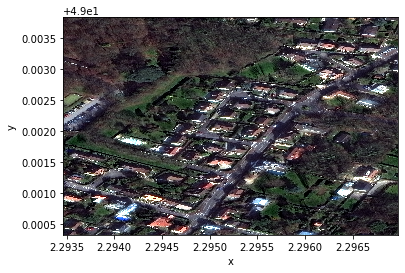

In [155]:
aoi = "AOI_3_Paris"
img_id = 482
img_ds = sp_catalog.train_rgb8_img(aoi=aoi, img_id=img_id)
img = img_ds.read()
img.plot.imshow()

In [159]:
# Read in the corresponding geojson file
rbuff_ds = sp_catalog.train_rbuffer_vec(aoi=aoi, img_id=img_id)
rbuff = rbuff_ds.read()


ValueError: No plugins loaded for this entry: shape

In [214]:
%%opts Curve [height=400, width=700, tools=['hover', 'xbox_select'] ]
curve

:Curve   [Year]   (Motor vehicle theft rate)

In [61]:
def get_vline(x):
    return hv.VLine(x).opts(color='red',line_width=2)
get_vline(0.1)

:VLine   [x,y]

In [62]:
from holoviews import streams

In [113]:
pointer = streams.PointerXY()
print(pointer.source)
print(pointer.contents)

None
{'x': None, 'y': None}


In [115]:
# pointer.update(x=10)
print(pointer.contents)
print(id(pointer))

{'x': None, 'y': None}
140047635621536


In [116]:
# import ipywidgets as iw
out = iw.Output(layout={'border': '1px solid black'})


In [117]:
out

Output(layout=Layout(border='1px solid black'))

In [118]:
# quick test
with out:
    print(pointer.contents)

In [123]:
@out.capture(clear_output)
def iw_output_subscriber(x, y):
    print(f'x: {x}, y: {y}')


In [ ]:
# quick test
import time
for i in range(5):
    pointer.event(x=0.1*i,y=0.5)
    time.sleep(2)


Looking great. Let's add this function as a callback handler to pointer stream obj.

In [ ]:
pointer.add_subscriber(iw_output_subscriber)
print(pointer.subscribers)

In [130]:
p_dmap = hv.DynamicMap(lambda x,y: hv.Points( [(x,y)] ),
                       streams=[pointer]).opts(

Note: this dmap is automatically registered as the **source** of the pointer LinkedStream obj

In [151]:
p_dmap.opts(
    opts.Points(size=7, tools=['hover'])
)

:DynamicMap   []
   :Points   [x,y]

In [138]:
out

Output(layout=Layout(border='1px solid black'), outputs=({'name': 'stdout', 'text': "{'x': None, 'y': None}\nx…

Now the following should trigger update on both output and p_dmap representation

In [140]:
# quick test
out.clear_output()
for i in range(5):
    pointer.event(x=0.1*i,y=0.5)
    time.sleep(1)


Good, it's working as expected:)

We can actually do this without mixing holoviews and ipywidgets (although I love the output widgets from ipywidget library. Let's replace the output ipywideget with a holoview's Element of type `hv.Table`. Another option would be `hv.Div`.
                                                                 

In [153]:
%%opts Table (editable=True)
table = hv.Table([(0,0)], kdims=['x','y'])
table

:Table   [x,y]

In [147]:
from holoviews.plotting.links import DataLink

In [158]:
DataLink(p_dmap, table)

DataLink(name='DataLink11436')

In [159]:
(p_dmap + table).opts(
    opts.Points(size=7, tools=['hover']),
    opts.Table(editable=True, width=200)
)

AttributeError: 'PointerXY' object has no attribute '_plot_id'

:Layout
   .DynamicMap.I :DynamicMap   []
      :Points   [x,y]
   .Table.I      :Table   [x,y]

In [35]:
todo: link the table and the scatterplot 

SyntaxError: invalid syntax (<ipython-input-35-5a4e2fb18f43>, line 1)

2. Larger dataset 

## todo:
- [ ] link the table and the scatterplot 
- [ ] holomaps (use the fields as key dim_
- [ ] holomaps - barchart of all variables, dropdown for time as keys
- [ ] use it for spacenet dataset -- local filesystems

# Nice GUI

In [47]:
intake.gui

Intake GUI instance: to get widget to display, you must install ipy/jupyter-widgets, run in a notebook and, in the case of jupyter-lab, install the jlab extension.

In [52]:
# the gui frontend is linked to python kernel.
# so we can programatically access the catelog entry selected in the gui as `intake.gui.item` attribute
intake.gui.item

<Catalog Entry: airline_flights>

In [49]:
# Get quick information about this selected data source and dataset
intake.gui.item.discover()

{'datashape': None,
 'dtype': {'year': 'float64',
  'month': 'float64',
  'day': 'float64',
  'dayofweek': 'float64',
  'dep_time': 'float64',
  'crs_dep_time': 'float64',
  'arr_time': 'float64',
  'crs_arr_time': 'float64',
  'carrier': 'object',
  'flight_num': 'float64',
  'tail_num': 'float64',
  'actual_elapsed_time': 'float64',
  'crs_elapsed_time': 'float64',
  'airtime': 'float64',
  'arrdelay': 'float64',
  'depdelay': 'float64',
  'origin': 'object',
  'dest': 'object',
  'distance': 'float64',
  'taxi_in': 'float64',
  'taxi_out': 'float64',
  'cancelled': 'float64',
  'cancellation_code': 'object',
  'diverted': 'float64',
  'carrier_delay': 'float64',
  'weather_delay': 'float64',
  'nas_delay': 'float64',
  'security_delay': 'float64',
  'late_aircraft_delay': 'float64'},
 'shape': (None, 29),
 'npartitions': 1,
 'metadata': {'cache': [],
  'catalog_dir': '/home/hayley/miniconda3/envs/earthml/share/intake/'}}

We can inspect the first several lines of the file using ``.head``, or a random set of rows using ``.sample(n)``

In [20]:
training_df.head();
training_df.sample(5)

NameError: name 'training_df' is not defined

To get a better sense of how this dataframe is set up, we can look at ``.info()``

In [21]:
training_df.info()

NameError: name 'training_df' is not defined

To use methods like `pd.read_csv`, all data needs to be on the local filesystem (or on one of the limited remote specification formats supported by Pandas, such as S3). We could of course put in various commands here to fetch a file explicitly from a remote server, but the notebook would then very quickly get complex and unreadable.

Instead, for larger datasets, we can automate those steps using intake so that remote and local data can be treated similarly. 

In [7]:
import intake

training = intake.open_csv('../data/landsat5_training.csv')
mro(training)

/home/hayley/miniconda3/envs/earthml/lib/python3.7/importlib/_bootstrap.py:219: ImportWarning: can't resolve package from __spec__ or __package__, falling back on __name__ and __path__
  return f(*args, **kwds)
/home/hayley/miniconda3/envs/earthml/lib/python3.7/site-packages/intake/source/cache.py:434: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated, and in 3.8 it will stop working
  class CacheMetadata(collections.MutableMapping):
/home/hayley/miniconda3/envs/earthml/lib/python3.7/site-packages/intake/catalog/local.py:566: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  data = yaml.load(text)


[intake.source.csv.CSVSource,
 intake.source.base.DataSource,
 intake.source.base.PatternMixin,
 object]

To get better insight into the data without loading it all in just yet, we can inspect the data using ``.to_dask()``

In [7]:
training_dd = training.to_dask() # doesn't actually load the whole data
training_dd.head() 

NameError: name 'training' is not defined

In [8]:
training_dd.info() # since we didn't actually load in the entire dataset, we don't know the length of the dataframe

NameError: name 'training_dd' is not defined

To get a full pandas.DataFrame object, use ``.read()`` to load in all the data.

In [9]:
training_df = training.read()
training_df.info()

NameError: name 'training' is not defined

**NOTE:** There are different items in these two info views which reflect what is knowable before and after we read all the data. For instance, it is not possible to know the ``shape`` of the whole dataset before it is loaded.

## Loading multiple files

In addition to allowing partitioned reading of files, intake lets the user load and concatenate data across multiple files in one command

In [10]:
training = intake.open_csv(['../data/landsat5_training.csv', '../data/landsat8_training.csv'])

NameError: name 'intake' is not defined

In [11]:
training_df = training.read()
training_df.info()
training_df.head()

NameError: name 'training' is not defined

**NOTE:** The length of the dataframe has increased now that we are loading multiple sets of training data.

This can be more simply expressed as:

In [12]:
training = intake.open_csv('../data/landsat*_training.csv')

NameError: name 'intake' is not defined

Sometimes, there is data encoded in a file name or path that causes concatenated data to lose some important context. In this example, we lose the information about which version of landsat the training was done on. To keep track of that information, we can use a python format string to specify our path and declare a new field on our data. That field will get populated based on its value in the path. 

In [13]:
training = intake.open_csv('../data/landsat{version:d}_training.csv')
training_df = training.read()
training_df.head()

NameError: name 'intake' is not defined

In [ ]:
# Exercise: Try looking at the tail of the data using training_df.tail(), or a random sample using training_df.sample(5)

---

## Read multiple netcdf files in one line
* hayley
* 05/21/2019

### 1. Using `intake.open_netcdf` with python string formatting

In [126]:
FLDAS_DATA_DIR = '/home/hayley/data/mint/FLDAS_NOAH01_A_EA_D.001/2017/01/'
name_fmt  =  'FLDAS_NOAH01_A_EA_D.A201701{day:d}.001.nc'
fpath = os.path.join(FLDAS_DATA_DIR, name_fmt)
print(fpath)

/home/hayley/data/mint/FLDAS_NOAH01_A_EA_D.001/2017/01/FLDAS_NOAH01_A_EA_D.A201701{day:d}.001.nc


In [45]:
fldas_ds = intake.open_netcdf(fpath) #datasource

In [54]:
fldas_ddf = fldas.to_dask() #dask dataframe

In [101]:
# vs
# fldas_ds2 = intake.open_netcdf(os.path.join(FLDAS_DATA_DIR, 'FLDAS_NOAH01_A_EA_D.A201701*.001.nc'))
# dataset2 = fldas_ds2.read() # returns xarray.Dataset
# dataset2

In [63]:
nprint(*mro(fldas_ddf),header=False)

<class 'xarray.core.dataset.Dataset'>
<class 'collections.abc.Mapping'>
<class 'collections.abc.Collection'>
<class 'collections.abc.Sized'>
<class 'collections.abc.Iterable'>
<class 'collections.abc.Container'>
<class 'xarray.core.common.ImplementsDatasetReduce'>
<class 'xarray.core.common.DataWithCoords'>
<class 'xarray.core.arithmetic.SupportsArithmetic'>
<class 'xarray.core.common.AttrAccessMixin'>
<class 'object'>


In [24]:
# inspect the dask df
fldas_ddf.info;

SyntaxError: EOL while scanning string literal (<ipython-input-24-4502b6683cd3>, line 2)

In [75]:
fldas_dataset = fldas_ds.read() # read all data to memory


In [91]:
mro = get_mro
pprint(mro(fldas_dataset))

[<class 'xarray.core.dataset.Dataset'>,
 <class 'collections.abc.Mapping'>,
 <class 'collections.abc.Collection'>,
 <class 'collections.abc.Sized'>,
 <class 'collections.abc.Iterable'>,
 <class 'collections.abc.Container'>,
 <class 'xarray.core.common.ImplementsDatasetReduce'>,
 <class 'xarray.core.common.DataWithCoords'>,
 <class 'xarray.core.arithmetic.SupportsArithmetic'>,
 <class 'xarray.core.common.AttrAccessMixin'>,
 <class 'object'>]


In [94]:
dset = fldas_dataset
print(dset.dims)

Frozen(SortedKeysDict({'time': 31, 'X': 294, 'Y': 348, 'concat_dim': 31, 'bnds': 2}))


In [95]:
dset

<xarray.Dataset>
Dimensions:                 (X: 294, Y: 348, bnds: 2, concat_dim: 31, time: 31)
Coordinates:
  * time                    (time) datetime64[ns] 2017-01-01 ... 2017-01-31
  * X                       (X) float64 22.05 22.15 22.25 ... 51.15 51.25 51.35
  * Y                       (Y) float64 -11.75 -11.65 -11.55 ... 22.85 22.95
    day                     (concat_dim) int64 1 2 3 4 5 6 ... 26 27 28 29 30 31
Dimensions without coordinates: bnds, concat_dim
Data variables:
    Evap_tavg               (concat_dim, time, Y, X) float32 9.233928e-06 ... 5.964822e-08
    LWdown_f_tavg           (concat_dim, time, Y, X) float32 375.54855 ... 321.767
    Lwnet_tavg              (concat_dim, time, Y, X) float32 -46.565353 ... -85.9726
    Psurf_f_tavg            (concat_dim, time, Y, X) float32 89235.81 ... 101033.07
    Qair_f_tavg             (concat_dim, time, Y, X) float32 0.014824226 ... 0.0057334765
    Qg_tavg                 (concat_dim, time, Y, X) float32 -15.582942 ... -6

## visualize the dataset using geoviews

In [16]:
import holoviews as hv
from holoviews import opts
import geoviews as gv
hv.extension('matplotlib')


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

In [108]:
# hv_dataset = hv.Dataset(fldas_dataset, ['time', 'X', 'Y'], 'Qair_f_tavg')
data_t0 = fldas_dataset.sel(bnds=0)

In [118]:
hv.Dataset(temp).to(hv.Image, ['X','Y']).

:HoloMap   [time]
   :Image   [X,Y]   (Evap_tavg)

/home/hayley/miniconda3/envs/earthml/lib/python3.7/_collections_abc.py:841: MatplotlibDeprecationWarning: 
The savefig.frameon rcparam was deprecated in Matplotlib 3.1 and will be removed in 3.3.
  self[key] = other[key]
/home/hayley/miniconda3/envs/earthml/lib/python3.7/_collections_abc.py:841: MatplotlibDeprecationWarning: 
The verbose.fileo rcparam was deprecated in Matplotlib 3.1 and will be removed in 3.3.
  self[key] = other[key]
/home/hayley/miniconda3/envs/earthml/lib/python3.7/_collections_abc.py:841: MatplotlibDeprecationWarning: 
The verbose.level rcparam was deprecated in Matplotlib 3.1 and will be removed in 3.3.
  self[key] = other[key]
/home/hayley/miniconda3/envs/earthml/lib/python3.7/_collections_abc.py:841: MatplotlibDeprecationWarning: 
The savefig.frameon rcparam was deprecated in Matplotlib 3.1 and will be removed in 3.3.
  self[key] = other[key]
/home/hayley/miniconda3/envs/earthml/lib/python3.7/_collections_abc.py:841: MatplotlibDeprecationWarning: 
The verbose.f

:Image   [x,y]   (z)
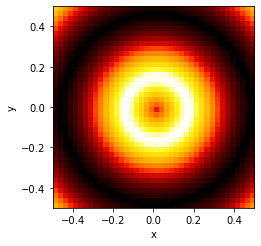

In [17]:

import numpy as np
X = np.arange(-5, 5, 0.25)
Y = np.arange(-5, 5, 0.25)
X, Y = np.meshgrid(X, Y)
R = np.sqrt(X**2 + Y**2)
Z = np.sin(R)
img = hv.Image(Z)

img

In [104]:
hv_dataset = hv.Dataset(dataset2, ['time', 'X', 'Y'], 'Qair_f_tavg')

In [124]:
hv_dataset

:Dataset   [time,X,Y]   (Qair_f_tavg)

In [107]:
hv_dataset.to(hv.Image, ['X','Y']).hist()

ValueError: axes don't match array

### 2. Using `intake`'s catalog files


In [69]:
mro(

## Using Catalogs

For more complicated setups, we use the file catalog.yml to declare how the data should be loaded. The catalog lays out how the data should be loaded, defines some metadata, and specifies any patterns in the file path that should be included in the data. Here is an example of a catalog entry:

```
sources:
  landsat_5_small:
    description: Small version of Landsat 5 Surface Reflectance Level-2 Science Product.
    driver: rasterio
    cache:
      - argkey: urlpath
        regex: 'earth-data/landsat'
        type: file
    args:
      urlpath: 's3://earth-data/landsat/small/LT05_L1TP_042033_19881022_20161001_01_T1_sr_band{band:d}.tif'
      chunks:
        band: 1
        x: 50
        y: 50
      concat_dim: band
      storage_options: {'anon': True}
```

The ``urlpath`` can be a path to a file, list of files, or a path with glob notation. Alternatively the path can be written as a python style [format_string](https://docs.python.org/3.6/library/string.html#format-string-syntax). In the case where the ``urlpath`` is a format string, the fields specified in that string will be parsed from the filenames and returned in the data. 

In [70]:
cat = intake.open_catalog('../catalog.yml')
list(cat)

/home/hayley/miniconda3/envs/earthml/lib/python3.7/site-packages/intake/catalog/local.py:566: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  data = yaml.load(text)


['landsat_5_small', 'landsat_8_small', 'landsat_5', 'landsat_8', 'google_landsat_band', 'amazon_landsat_band', 'fluxnet_daily', 'fluxnet_metadata', 'seattle_lidar']

In [71]:
# Exercise: Read the description of the landsat_5_small data source using cat.landsat_5_small.description
cat.landsat_5_small.describe()

{'container': 'xarray', 'description': 'Small version of Landsat 5 Surface Reflectance Level-2 Science Product.', 'direct_access': 'forbid', 'user_parameters': []}

**NOTE:** If you don't have the data cached yet, then the next cell will take a few seconds.

In [72]:
landsat_5 = cat.landsat_5_small
landsat_5.to_dask()

<xarray.DataArray (band: 6, y: 300, x: 300)>
dask.array<shape=(6, 300, 300), dtype=float64, chunksize=(1, 50, 50)>
Coordinates:
  * y        (y) float64 4.309e+06 4.309e+06 4.309e+06 ... 4.264e+06 4.264e+06
  * x        (x) float64 3.324e+05 3.326e+05 3.327e+05 ... 3.771e+05 3.772e+05
  * band     (band) int64 1 2 3 4 5 7
Attributes:
    transform:   (150.0, 0.0, 332325.0, 0.0, -150.0, 4309275.0)
    crs:         +init=epsg:32611
    res:         (150.0, 150.0)
    is_tiled:    0
    nodatavals:  (nan,)

The data has not yet been loaded so we don't have access to the actual data values yet, but we do have access to coordinates and metadata.

In [74]:
pprint(mro(landsat_5))

[<class 'intake.catalog.local.LocalCatalogEntry'>,
 <class 'intake.catalog.entry.CatalogEntry'>,
 <class 'object'>]


## Visualizing the data

To get a quick sense of the data, we can plot it using [hvPlot](https://hvplot.pyviz.org/), which provides interactive plotting commands for Intake, Pandas, XArray, Dask, and GeoPandas. We'll look more closely at hvPlot and its options in later tutorials.

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
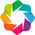

In [82]:
import hvplot.intake
intake.output_notebook()

import holoviews as hv
hv.extension('bokeh')

We can quickly generate a plot of each of the landsat bands using the overview plot declared in the catalog. Here is the relevant part of `catalog.yml`:

```
metadata:
  plots:
    band_image:
      kind: 'image'
      x: 'x'
      y: 'y'
      groupby: 'band'
      rasterize: True
      width: 400
      dynamic: False
```

In [22]:
landsat_5.hvplot.band_image()

:HoloMap   [band]
   :Image   [x,y]   (value)

In [23]:
landsat_5.plots

['band_image']

## Accessing the data
So far we have been looking at the intake data entry object `landsat_5`. To access the data on this object we will read the data. If the data are big, we can use dask to do this using the `.to_dask()` method to create a `dask xarray.DataArray`. If the data are small, then we can use the `read()` method to read all the data straight into a regular `xarray.DataArray`. Once in an `xarray` object the data can be more easily manipulated and visualized.

In [87]:
type(landsat_5)

intake.catalog.local.LocalCatalogEntry

### Xarray DataArray
To get an `xarray` object, we'll use the `.read()` method.

In [88]:
landsat_5_xda = landsat_5.read()
type(landsat_5_xda)

xarray.core.dataarray.DataArray

We can use tab completion to explore what other information is stored on our xarray.DataArray object. We can use tab completion to explore attributes and methods available on our object.

In [89]:
# Exercise: Try typing landsat_5_xda. and press [tab] - don't forget the trailing dot!
landsat_5_xda.crs

'+init=epsg:32611'

### Numpy Array
Machine Learning pipelines such as scikit-learn accept Numpy arrays as input. These arrays are accessible in DataArray objects on the `values` attribute.

In [ ]:
landsat_5_npa = landsat_5_xda.values
type(landsat_5_npa)

---

In [31]:
cat = 

^C


### Next:

Now that you have loaded your data, you will typically need to reshape it appropriately before it can be fed into a machine-learning pipeline. These steps are detailed in the next tutorial: [Alignment and Preprocessing](03_Alignment_and_Preprocessing.ipynb).

---
---
## Exp 1: Use FLDAS dataset
* hayley
* 5/21/2019
* purpose: share how to use `intake` and `pyviz` to read data from catalogs and show quick visualization 
    - the workflow of reading a data using Catalog (python `intake`) and visualize the data using (`holoviews` and `geoviews`)


In [9]:
import requests, os
from pathlib import Path

In [11]:
base_url = 'https://workflow.isi.edu/MINT/FLDAS/FLDAS_NOAH01_A_EA_D.001/2001/01/'
fname = 'FLDAS_NOAH01_A_EA_D.A20010102.001.nc'

In [12]:
fpath = os.path.join(base_url, fname)
req = requests.get(fpath)

In [13]:
req.status_code

200

In [15]:
import xarray as xr

/home/hayley/miniconda3/envs/earthml/lib/python3.7/importlib/_bootstrap.py:219: ImportWarning: can't resolve package from __spec__ or __package__, falling back on __name__ and __path__
  return f(*args, **kwds)
/home/hayley/miniconda3/envs/earthml/lib/python3.7/site-packages/heapdict.py:11: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated, and in 3.8 it will stop working
  class heapdict(collections.MutableMapping):


In [16]:
temp = req.content

In [18]:
data = req.raw

In [ ]:
MINT_DATA_DIR = Path('/home/hayley/data/mint/FLDAS_NOAH01_A_EA_D.001/2017/')
month = '01'
day = '01'
date = f'2017{month}{day}'

print('date', date)

